In [1]:
import torch
import torchvision
import matplotlib.pyplot as plt

from torch import nn
from torchvision import transforms

# Import torchvision
try:
  from torchinfo import summary
except:
  print('[INFO] Couldnt find torchinfo.... installing it.')
  !pip install -q torchinfo
  from torchinfo import summary

# Import going_modular directory
try:
  from going_modular.going_modular import data_setup, engine
except:
  # get the modular scripts
  print('[INFO] Couldnt find going_modular scripts.... Downloading them from github')
  !git clone https://github.com/mrdbourke/pytorch-deep-learning
  !mv pytorch-deep-learning/going_modular .
  !rm -rf pytorch-deep-learning
  from going_modular.going_modular import data_setup, engine

[INFO] Couldnt find torchinfo.... installing it.
[INFO] Couldnt find going_modular scripts.... Downloading them from github
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 4036, done.
remote: Counting objects: 100% (1224/1224), done.
remote: Compressing objects: 100% (226/226), done.
remote: Total 4036 (delta 1068), reused 1085 (delta 995), pack-reused 2812
Receiving objects: 100% (4036/4036), 651.02 MiB | 40.82 MiB/s, done.
Resolving deltas: 100% (2361/2361), done.
Updating files: 100% (248/248), done.


In [2]:
# Setup device agnostic code
if torch.cuda.is_available():
    device = "cuda:0"
else:
    device = "cpu"
device = torch.device(device)
device

device(type='cuda', index=0)

In [3]:
# Set seeds
def set_seeds(seed: int = 42):
  """
  Sets random sets of torch operations.

  Args:
    seed (int, optional): Random Seed to set. Default to 42.
  """
  # Set the seed for general torch operations
  torch.manual_seed(42)
  # Set the seed for CUDA torch operations
  torch.cuda.manual_seed(42)

#1. Get the Data

In [4]:
import os
import zipfile

from pathlib import Path

import requests

def download_data(source: str,
                  destination: str,
                  remove_source: bool = True) -> Path:
    """Downloads a zipped dataset from source and unzips to destination.

    Args:
        source (str): A link to a zipped file containing data.
        destination (str): A target directory to unzip data to.
        remove_source (bool): Whether to remove the source after downloading and extracting.

    Returns:
        pathlib.Path to downloaded data.

    Example usage:
        download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                      destination="pizza_steak_sushi")
    """
    # Setup path to data folder
    data_path = Path("data/")
    image_path = data_path / destination

    # If the image folder doesn't exist, download it and prepare it...
    if image_path.is_dir():
        print(f"[INFO] {image_path} directory exists, skipping download.")
    else:
        print(f"[INFO] Did not find {image_path} directory, creating one...")
        image_path.mkdir(parents=True, exist_ok=True)

        # Download pizza, steak, sushi data
        target_file = Path(source).name
        with open(data_path / target_file, "wb") as f:
            request = requests.get(source)
            print(f"[INFO] Downloading {target_file} from {source}...")
            f.write(request.content)

        # Unzip pizza, steak, sushi data
        with zipfile.ZipFile(data_path / target_file, "r") as zip_ref:
            print(f"[INFO] Unzipping {target_file} data...")
            zip_ref.extractall(image_path)

        # Remove .zip file
        if remove_source:
            os.remove(data_path / target_file)

    return image_path

image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] Did not find data/pizza_steak_sushi directory, creating one...
[INFO] Downloading pizza_steak_sushi.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip...
[INFO] Unzipping pizza_steak_sushi.zip data...


PosixPath('data/pizza_steak_sushi')

#2. Create Datasets and DataLoaders

##2.1 Create DataLoaders with manual transforms

In [5]:
# Setup directory
train_dir = image_path / 'train'
test_dir = image_path / 'test'

train_dir, test_dir

(PosixPath('data/pizza_steak_sushi/train'),
 PosixPath('data/pizza_steak_sushi/test'))

In [6]:
# Setup imagenet Normalization levels
normalize = transforms.Normalize(mean = [0.485, 0.456, 0.406],
                                 std = [0.229, 0.224, 0.225])

# Create transform pipeline manually
from torchvision import transforms
manual_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize
])
print(f'Manually Created transforms: {manual_transforms}')

# Create dataloaders
from going_modular.going_modular import data_setup
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir,
                                                                               test_dir = test_dir,
                                                                               transform = manual_transforms,
                                                                               batch_size = 32)
train_dataloader, test_dataloader, class_names

Manually Created transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


(<torch.utils.data.dataloader.DataLoader at 0x7e22b02efa00>,
 ['pizza', 'steak', 'sushi'])

## 2.2 Create dataloaders using automatically created transforms

In [7]:
# Setup pretrained weights
weights = torchvision.models.EfficientNet_B1_Weights.DEFAULT # DEFAULT is best available

# Get the transforms from the weights
automatic_transforms = weights.transforms()
print(f'Automatically created transforms : {automatic_transforms}')

# Create DataLoaders
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir,
                                                                               test_dir =  test_dir,
                                                                               transform = automatic_transforms,
                                                                               batch_size = 32)

train_dataloader, test_dataloader, class_names

Automatically created transforms : ImageClassification(
    crop_size=[240]
    resize_size=[255]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)


(<torch.utils.data.dataloader.DataLoader at 0x7e237ce79d50>,
 ['pizza', 'steak', 'sushi'])

## 3. Getting a pretrained model, freeze the base layers and change the classifier head

In [8]:
# Setup the model with pretrained weights and send it the target device
model = torchvision.models.efficientnet_b1(weights = weights).to(device)
model

Downloading: "https://download.pytorch.org/models/efficientnet_b1-c27df63c.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b1-c27df63c.pth
100%|██████████| 30.1M/30.1M [00:00<00:00, 77.7MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [9]:
# Freeze all base layers by require_grad
for param in model.features.parameters():
    param.requires_grad = False

In [10]:
model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

In [11]:
# Adjust the classifier head
model.classifier = nn.Sequential(
    nn.Dropout(p = 0.2, inplace = True),
    nn.Linear(in_features=1280, out_features = len(class_names))
).to(device)

In [12]:
from torchinfo import summary
summary(model,
        input_size=(32, 3, 224, 224),
        verbose = 0,
        col_names = ['input_size', 'output_size', 'num_params', 'trainable'],
        col_width = 20,
        row_settings = ['var_names'])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

## 4. Train a single model and track result

In [13]:
# Define loss_fn and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)

In [14]:
# Setup a summary-writer
from torch.utils.tensorboard import SummaryWriter
# Create a writer with all default settings
writer = SummaryWriter()
writer

In [15]:
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

from going_modular.going_modular.engine import train_step, test_step

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

        ## New: Experiment Tracking ##
        writer.add_scalars(main_tag='Loss',
                          tag_scalar_dict = {'train_loss': train_loss,
                                             'test_loss': test_loss},
                          global_step = epoch)
        writer.add_scalars(main_tag = 'Accuracy',
                          tag_scalar_dict = {'train_acc': train_acc,
                                             'test_acc': test_loss},
                          global_step = epoch)
        writer.add_graph(model = model,
                         input_to_model = torch.randn(32, 3, 224, 224).to(device))

    # Close the writer
    writer.close()
    # End New #

    # Return the filled results at the end of the epochs
    return results


In [16]:
# Set seed
set_seeds()
results = train(model = model,
                train_dataloader = train_dataloader,
                test_dataloader = test_dataloader,
                optimizer = optimizer,
                loss_fn = loss_fn,
                epochs = 5,
                device = device)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9554 | train_acc: 0.6836 | test_loss: 0.4973 | test_acc: 0.8267
Epoch: 2 | train_loss: 0.5137 | train_acc: 0.8047 | test_loss: 0.3596 | test_acc: 0.8873
Epoch: 3 | train_loss: 0.5676 | train_acc: 0.8320 | test_loss: 0.3469 | test_acc: 0.8873
Epoch: 4 | train_loss: 0.2019 | train_acc: 0.9766 | test_loss: 0.3219 | test_acc: 0.8769
Epoch: 5 | train_loss: 0.7001 | train_acc: 0.8086 | test_loss: 0.3568 | test_acc: 0.8769


# 5. View our model results using tensorboard

In [17]:
results

{'train_loss': [0.9554437808692455,
  0.5137108974158764,
  0.5675586368888617,
  0.20185769256204367,
  0.7000558292493224],
 'train_acc': [0.68359375, 0.8046875, 0.83203125, 0.9765625, 0.80859375],
 'test_loss': [0.49726295471191406,
  0.35957834124565125,
  0.34690335392951965,
  0.3219286898771922,
  0.3567793170611064],
 'test_acc': [0.8267045454545454,
  0.8873106060606061,
  0.8873106060606061,
  0.8768939393939394,
  0.8768939393939394]}

In [18]:
# Load tensorboard extension
%load_ext tensorboard

In [19]:
# Start tensorboard
# Please ignore the error page in the output and go to the next cell
%tensorboard --logdir ./runs --host=127.0.0.1 --port=6006 --load_fast=false

<IPython.core.display.Javascript object>

In [20]:
# Access tensorboard via colab's proxy
# Click the link that appears in the output
from google.colab import output
output.serve_kernel_port_as_window(6006, path="")

<IPython.core.display.Javascript object>

## 6. Create a function to prepare a `SummaryWriter()` instance

In [21]:
from torch.utils.tensorboard import SummaryWriter
def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str = None):
  """
  Creates a torch.utils.tensorboard.SummaryWriter() instance tracking to specific directory
  """
  from datetime import datetime
  import os

  # Get timestamp of current date in reverse order
  timestamp = datetime.now().strftime('%Y-%m-%d')

  if extra:
    # Create log directory path
    log_dir = os.path.join('runs', timestamp, experiment_name, model_name, extra)
  else:
    log_dir = os.path.join('runs', timestamp, experiment_name, model_name)
  print(f'[INFO] Created Summary writer saving to {log_dir}')
  return SummaryWriter(log_dir = log_dir)

In [22]:
example_writer = create_writer(experiment_name = 'data_10_percent',
                               model_name = 'effnetb1',
                               extra = '5_epochs')
example_writer

[INFO] Created Summary writer saving to runs/2023-11-10/data_10_percent/effnetb1/5_epochs


## 6.1 Update the `train()` function to include a `writer` parameter

In [23]:
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

from going_modular.going_modular.engine import train_step, test_step

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        if writer:

          ## New: Experiment Tracking ##
          writer.add_scalars(main_tag='Loss',
                            tag_scalar_dict = {'train_loss': train_loss,
                                              'test_loss': test_loss},
                            global_step = epoch)
          writer.add_scalars(main_tag = 'Accuracy',
                            tag_scalar_dict = {'train_acc': train_acc,
                                              'test_acc': test_loss},
                            global_step = epoch)
          writer.add_graph(model = model,
                          input_to_model = torch.randn(32, 3, 224, 224).to(device))

          # Close the writer
          writer.close()
        else:
          pass
    # End New #

    # Return the filled results at the end of the epochs
    return results

## 7. Setting up series of modelling experiments

* Setup 2x modelling experiments with effnetb1 for 5 epochs and 10 epochs

### Performing multiple experiments

### Downloading different datasets

we want two datasets:
  1.  Pizza, Steak, Sushi 10%
  2. Pizza, Steak, Sushi 20%

In [24]:
# Download 10% and 20% data
data_10_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                                     destination="pizza_steak_sushi")

data_20_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
                                     destination="pizza_steak_sushi_20_percent")

[INFO] data/pizza_steak_sushi directory exists, skipping download.
[INFO] Did not find data/pizza_steak_sushi_20_percent directory, creating one...
[INFO] Downloading pizza_steak_sushi_20_percent.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip...
[INFO] Unzipping pizza_steak_sushi_20_percent.zip data...


## 7.2 Transforms datasets and create dataloaders

1. Resize the images to (224, 224)
2. Make sure images values are between [0, 1]
3. Normalize the images so they have the same distribution as imageNet

In [25]:
# Setup training directory paths
train_dir_10_percent = data_10_percent_path / 'train'
train_dir_20_percent = data_20_percent_path / 'train'

# Setup test directory paths
test_dir = data_10_percent_path / 'test'

train_dir_10_percent, train_dir_20_percent, test_dir

(PosixPath('data/pizza_steak_sushi/train'),
 PosixPath('data/pizza_steak_sushi_20_percent/train'),
 PosixPath('data/pizza_steak_sushi/test'))

In [26]:
from torchvision import transforms

normalize = transforms.Normalize(mean = [0.485, 0.456, 0.406],
                                 std = [0.229, 0.224, 0.225])

# Compose transforms
simple_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize
])

In [27]:
BATCH_SIZE = 32

# Create 10% trainaing and test dataloaders
train_dataloader_10_percent, test_dataloader_10_percent, class_names = data_setup.create_dataloaders(train_dir = train_dir_10_percent,
                                                                                                     test_dir = test_dir,
                                                                                                     transform = simple_transforms,
                                                                                                     batch_size = BATCH_SIZE)
train_dataloader_20_percent, test_dataloader_20_percent, class_names = data_setup.create_dataloaders(train_dir = train_dir_20_percent,
                                                                                                     test_dir = test_dir,
                                                                                                     transform = simple_transforms,
                                                                                                     batch_size = BATCH_SIZE)
print(f'Number of batches of size {BATCH_SIZE} in 10% train_data: {len(train_dataloader_10_percent)}')
print(f'Number of batches of size {BATCH_SIZE} in 20% train_data: {len(train_dataloader_20_percent)}')
print(f'Number of batches of size {BATCH_SIZE} in 10% test_data: {len(test_dataloader_10_percent)}')
print(f'Class names: {class_names}')

Number of batches of size 32 in 10% train_data: 8
Number of batches of size 32 in 20% train_data: 15
Number of batches of size 32 in 10% test_data: 3
Class names: ['pizza', 'steak', 'sushi']


### 7.3 Create feature extractor models

 1. `torchvision.models.efficientnet_b0()`
 2. `torchvision.models.efficientnet_b2()`

In [28]:
from torchvision.models import efficientnet_b4, EfficientNet_B4_Weights
from torchvision.models._api import WeightsEnum
from torch.hub import load_state_dict_from_url

def get_state_dict(self, *args, **kwargs):
    kwargs.pop("check_hash")
    return load_state_dict_from_url(self.url, *args, **kwargs)
WeightsEnum.get_state_dict = get_state_dict

effnet_b4_weights = efficientnet_b4(weights=EfficientNet_B4_Weights.IMAGENET1K_V1)
effnet_b4 = efficientnet_b4(weights="DEFAULT")

Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-7eb33cd5.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-7eb33cd5.pth
100%|██████████| 74.5M/74.5M [00:00<00:00, 78.3MB/s]


In [29]:
effnet_b4.classifier

Sequential(
  (0): Dropout(p=0.4, inplace=True)
  (1): Linear(in_features=1792, out_features=1000, bias=True)
)

In [30]:
summary(model = effnet_b4,
        input_size = (32, 3, 224, 224),
        verbose = 0,
        col_names = ['input_size','output_size','num_params','trainable'],
        col_width = 20,
        row_settings = ['var_names'])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1792, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 48, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 48, 112, 112]   1,296                True
│    │    └─BatchNorm2d (1)                                  [32, 48, 112, 112]   [32, 48, 112, 112]   96                   True
│    │    └─SiLU (2)                                         [32, 48, 112, 112]   [32, 48, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 48, 112, 112]   [32, 24, 112

In [39]:
import torchvision
from torch import nn

# Get num out features (one for each class pizza, steak, sushi)
OUT_FEATURES = len(class_names)

# Create an EffNetB0 feature extractor
def create_effnetb0():
    # 1. Get the base mdoel with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
    model = torchvision.models.efficientnet_b0(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb0"
    print(f"[INFO] Created new {model.name} model.")
    return model

# Create an EffNetB2 feature extractor
def create_effnetb2():
    # 1. Get the base model with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
    model = torchvision.models.efficientnet_b2(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.3),
        nn.Linear(in_features=1408, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb2"
    print(f"[INFO] Created new {model.name} model.")
    return model

In [40]:
create_model_test = create_effnetb0()

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 86.5MB/s]

[INFO] Created new effnetb0 model.


In [41]:
summary(model = create_model_test,
        input_size = (32, 3, 224, 224),
        verbose = 0,
        col_names = ['input_size', 'output_size', 'num_params', 'trainable'],
        col_width = 20,
        row_settings = ['var_names'])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [43]:
create_model_test = create_effnetb2()

[INFO] Created new effnetb2 model.


In [44]:
summary(model = create_model_test,
        input_size = (32, 3, 224, 224),
        verbose = 0,
        col_names = ['input_size', 'output_size', 'num_params', 'trainable'],
        col_width = 20,
        row_settings = ['var_names'])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

### Create experiments and set up training code

In [45]:
# Create epoch list
num_epochs = [5, 10]

# Create Model list
models = ["effnetb0", "effnetb2"]

# Create DataLoader Dictionary
train_dataloaders = {'data_10_percent': train_dataloader_10_percent,
                     'data_20_percent': train_dataloader_20_percent}

In [46]:
%%time
from going_modular.going_modular.utils import save_model

# 1. Set the random seeds
set_seeds(seed=42)

# 2. Keep track of experiment numbers
experiment_number = 0

# 3. Loop through each DataLoader
for dataloader_name, train_dataloader in train_dataloaders.items():

    # 4. Loop through each number of epochs
    for epochs in num_epochs:

        # 5. Loop through each model name and create a new model based on the name
        for model_name in models:

            # 6. Create information print outs
            experiment_number += 1
            print(f"[INFO] Experiment number: {experiment_number}")
            print(f"[INFO] Model: {model_name}")
            print(f"[INFO] DataLoader: {dataloader_name}")
            print(f"[INFO] Number of epochs: {epochs}")

            # 7. Select the model
            if model_name == "effnetb0":
                model = create_effnetb0() # creates a new model each time (important because we want each experiment to start from scratch)
            else:
                model = create_effnetb2() # creates a new model each time (important because we want each experiment to start from scratch)

            # 8. Create a new loss and optimizer for every model
            loss_fn = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

            # 9. Train target model with target dataloaders and track experiments
            train(model=model,
                  train_dataloader=train_dataloader,
                  test_dataloader=test_dataloader,
                  optimizer=optimizer,
                  loss_fn=loss_fn,
                  epochs=epochs,
                  device=device,
                  writer=create_writer(experiment_name=dataloader_name,
                                       model_name=model_name,
                                       extra=f"{epochs}_epochs"))

            # 10. Save the model to file so we can get back the best model
            save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
            save_model(model=model,
                       target_dir="models",
                       model_name=save_filepath)
            print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb0 model.
[INFO] Created Summary writer saving to runs/2023-11-10/data_10_percent/effnetb0/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0528 | train_acc: 0.4961 | test_loss: 0.8958 | test_acc: 0.6297
Epoch: 2 | train_loss: 0.9416 | train_acc: 0.5586 | test_loss: 0.8482 | test_acc: 0.5795
Epoch: 3 | train_loss: 0.8284 | train_acc: 0.6914 | test_loss: 0.7430 | test_acc: 0.8447
Epoch: 4 | train_loss: 0.7219 | train_acc: 0.7578 | test_loss: 0.6567 | test_acc: 0.8854
Epoch: 5 | train_loss: 0.6032 | train_acc: 0.8867 | test_loss: 0.6420 | test_acc: 0.8551
[INFO] Saving model to: models/07_effnetb0_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: effnetb2
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created Summary writer saving to runs/2023-11-10/data_10_percent/effnetb2/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0928 | train_acc: 0.3711 | test_loss: 0.9456 | test_acc: 0.7737
Epoch: 2 | train_loss: 0.9089 | train_acc: 0.6406 | test_loss: 0.9224 | test_acc: 0.6108
Epoch: 3 | train_loss: 0.8453 | train_acc: 0.6797 | test_loss: 0.8226 | test_acc: 0.6828
Epoch: 4 | train_loss: 0.7203 | train_acc: 0.8516 | test_loss: 0.6732 | test_acc: 0.8665
Epoch: 5 | train_loss: 0.7274 | train_acc: 0.7461 | test_loss: 0.6134 | test_acc: 0.9062
[INFO] Saving model to: models/07_effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created Summary writer saving to runs/2023-11-10/data_10_percent/effnetb0/10_epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0528 | train_acc: 0.4961 | test_loss: 0.8958 | test_acc: 0.6297
Epoch: 2 | train_loss: 0.9416 | train_acc: 0.5586 | test_loss: 0.8482 | test_acc: 0.5795
Epoch: 3 | train_loss: 0.8284 | train_acc: 0.6914 | test_loss: 0.7430 | test_acc: 0.8447
Epoch: 4 | train_loss: 0.7219 | train_acc: 0.7578 | test_loss: 0.6567 | test_acc: 0.8854
Epoch: 5 | train_loss: 0.6032 | train_acc: 0.8867 | test_loss: 0.6420 | test_acc: 0.8551
Epoch: 6 | train_loss: 0.5470 | train_acc: 0.8750 | test_loss: 0.6605 | test_acc: 0.8153
Epoch: 7 | train_loss: 0.6480 | train_acc: 0.7188 | test_loss: 0.6592 | test_acc: 0.8258
Epoch: 8 | train_loss: 0.5016 | train_acc: 0.9180 | test_loss: 0.5915 | test_acc: 0.8258
Epoch: 9 | train_loss: 0.4611 | train_acc: 0.8945 | test_loss: 0.5780 | test_acc: 0.8049
Epoch: 10 | train_loss: 0.5681 | train_acc: 0.7539 | test_loss: 0.5330 | test_acc: 0.8551
[INFO] Saving model to: models/07_effnetb0_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0928 | train_acc: 0.3711 | test_loss: 0.9456 | test_acc: 0.7737
Epoch: 2 | train_loss: 0.9089 | train_acc: 0.6406 | test_loss: 0.9224 | test_acc: 0.6108
Epoch: 3 | train_loss: 0.8453 | train_acc: 0.6797 | test_loss: 0.8226 | test_acc: 0.6828
Epoch: 4 | train_loss: 0.7203 | train_acc: 0.8516 | test_loss: 0.6732 | test_acc: 0.8665
Epoch: 5 | train_loss: 0.7274 | train_acc: 0.7461 | test_loss: 0.6134 | test_acc: 0.9062
Epoch: 6 | train_loss: 0.6089 | train_acc: 0.7656 | test_loss: 0.6384 | test_acc: 0.8570
Epoch: 7 | train_loss: 0.5998 | train_acc: 0.8164 | test_loss: 0.5942 | test_acc: 0.8665
Epoch: 8 | train_loss: 0.5486 | train_acc: 0.8281 | test_loss: 0.6022 | test_acc: 0.8769
Epoch: 9 | train_loss: 0.5174 | train_acc: 0.7891 | test_loss: 0.5559 | test_acc: 0.8873
Epoch: 10 | train_loss: 0.5073 | train_acc: 0.8203 | test_loss: 0.5427 | test_acc: 0.9176
[INFO] Saving model to: models/07_effnetb2_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9576 | train_acc: 0.6188 | test_loss: 0.6696 | test_acc: 0.8125
Epoch: 2 | train_loss: 0.7022 | train_acc: 0.8063 | test_loss: 0.6004 | test_acc: 0.8873
Epoch: 3 | train_loss: 0.5836 | train_acc: 0.8375 | test_loss: 0.5276 | test_acc: 0.9176
Epoch: 4 | train_loss: 0.4559 | train_acc: 0.8938 | test_loss: 0.4457 | test_acc: 0.8968
Epoch: 5 | train_loss: 0.4514 | train_acc: 0.8938 | test_loss: 0.4190 | test_acc: 0.9176
[INFO] Saving model to: models/07_effnetb0_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model: effnetb2
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created Summary writer saving to runs/2023-11-10/data_20_percent/effnetb2/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9830 | train_acc: 0.5521 | test_loss: 0.7558 | test_acc: 0.8456
Epoch: 2 | train_loss: 0.7181 | train_acc: 0.7917 | test_loss: 0.6397 | test_acc: 0.8665
Epoch: 3 | train_loss: 0.5791 | train_acc: 0.8771 | test_loss: 0.5380 | test_acc: 0.9176
Epoch: 4 | train_loss: 0.5310 | train_acc: 0.8333 | test_loss: 0.4998 | test_acc: 0.8769
Epoch: 5 | train_loss: 0.4890 | train_acc: 0.8625 | test_loss: 0.4333 | test_acc: 0.9176
[INFO] Saving model to: models/07_effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created Summary writer saving to runs/2023-11-10/data_20_percent/effnetb0/10_epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9576 | train_acc: 0.6188 | test_loss: 0.6696 | test_acc: 0.8125
Epoch: 2 | train_loss: 0.7022 | train_acc: 0.8063 | test_loss: 0.6004 | test_acc: 0.8873
Epoch: 3 | train_loss: 0.5836 | train_acc: 0.8375 | test_loss: 0.5276 | test_acc: 0.9176
Epoch: 4 | train_loss: 0.4559 | train_acc: 0.8938 | test_loss: 0.4457 | test_acc: 0.8968
Epoch: 5 | train_loss: 0.4514 | train_acc: 0.8938 | test_loss: 0.4190 | test_acc: 0.9176
Epoch: 6 | train_loss: 0.4222 | train_acc: 0.8604 | test_loss: 0.3974 | test_acc: 0.9176
Epoch: 7 | train_loss: 0.3849 | train_acc: 0.8583 | test_loss: 0.3780 | test_acc: 0.9280
Epoch: 8 | train_loss: 0.3451 | train_acc: 0.8938 | test_loss: 0.3784 | test_acc: 0.9280
Epoch: 9 | train_loss: 0.3723 | train_acc: 0.8917 | test_loss: 0.3627 | test_acc: 0.9280
Epoch: 10 | train_loss: 0.3593 | train_acc: 0.8938 | test_loss: 0.3280 | test_acc: 0.8864
[INFO] Saving model to: models/07_effnetb0_data_20_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9830 | train_acc: 0.5521 | test_loss: 0.7558 | test_acc: 0.8456
Epoch: 2 | train_loss: 0.7181 | train_acc: 0.7917 | test_loss: 0.6397 | test_acc: 0.8665
Epoch: 3 | train_loss: 0.5791 | train_acc: 0.8771 | test_loss: 0.5380 | test_acc: 0.9176
Epoch: 4 | train_loss: 0.5310 | train_acc: 0.8333 | test_loss: 0.4998 | test_acc: 0.8769
Epoch: 5 | train_loss: 0.4890 | train_acc: 0.8625 | test_loss: 0.4333 | test_acc: 0.9176
Epoch: 6 | train_loss: 0.3795 | train_acc: 0.9146 | test_loss: 0.4574 | test_acc: 0.8977
Epoch: 7 | train_loss: 0.3519 | train_acc: 0.9313 | test_loss: 0.4013 | test_acc: 0.8977
Epoch: 8 | train_loss: 0.3214 | train_acc: 0.9333 | test_loss: 0.4006 | test_acc: 0.8977
Epoch: 9 | train_loss: 0.3428 | train_acc: 0.8896 | test_loss: 0.4117 | test_acc: 0.9081
Epoch: 10 | train_loss: 0.3791 | train_acc: 0.8604 | test_loss: 0.3449 | test_acc: 0.9280
[INFO] Saving model to: models/07_effnetb2_data_20_percent_10_epochs.pth
------------------------------------

## View experiments using tensorboard

In [53]:
%load_ext tensorboard
%tensorboard --logdir ./runs --host=127.0.0.1 --port=6000 --load_fast=false

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [54]:
# Access tensorboard via colab's proxy
# Click the link that appears in the output
from google.colab import output
output.serve_kernel_port_as_window(6000, path="")

<IPython.core.display.Javascript object>

## Load in the best model and make predictions with it

In [55]:
# Setup model path
best_model_path = '/content/models/07_effnetb2_data_20_percent_10_epochs.pth'

# Instantiate the new instance of EfficientNetB2 (to load in saved state dict)
best_model = create_effnetb2()

# Load the saved best model state_dict()
best_model.load_state_dict(torch.load(best_model_path))

[INFO] Created new effnetb2 model.


<All keys matched successfully>

In [56]:
# Check the model file size
from pathlib import Path

# Get the model size in bytes and convert it to megabytes
effnetb2_model_size = Path(best_model_path).stat().st_size // (1024*1024)
print(f'EfficientB2 Feature extractor model size: {effnetb2_model_size} MB')

EfficientB2 Feature extractor model size: 29 MB


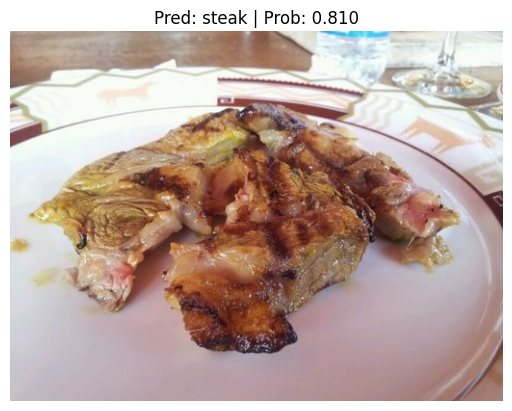

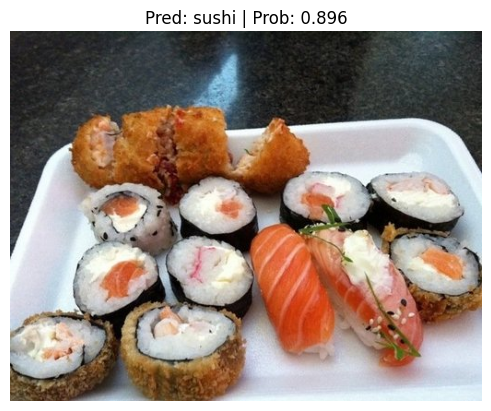

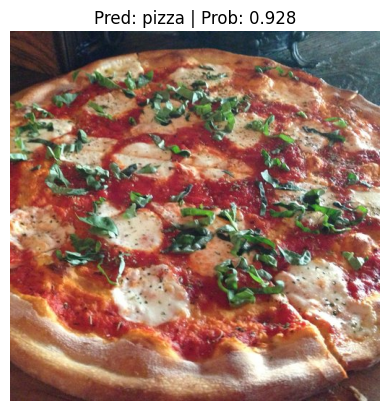

In [61]:
# Import functions to make predictions and plot them
from going_modular.going_modular.predictions import pred_and_plot_image

# Get random list of 3 image path names from the test dataset
import random
num_images_to_plot = 3
test_image_path_list = list(Path(data_20_percent_path / 'test').glob('*/*.jpg'))
test_image_path_sample = random.sample(test_image_path_list,
                                       k = num_images_to_plot)

for image_path in test_image_path_sample:
  pred_and_plot_image(model = best_model,
                      image_path = image_path,
                      class_names = class_names,
                      image_size = (224, 224))

## Making prediction on custom images by using our best performing model

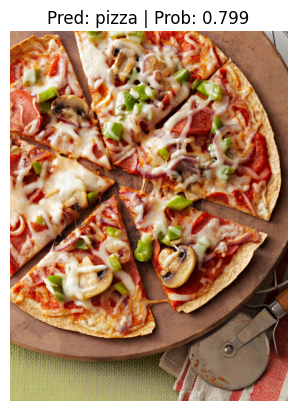

In [62]:
pred_and_plot_image(model = model,
                    image_path = '/content/pizza.jpg',
                    class_names = class_names)

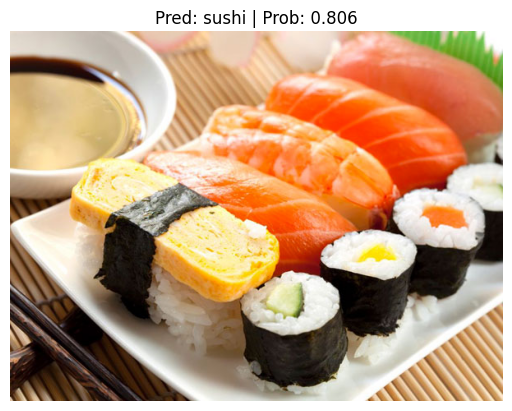

In [63]:
pred_and_plot_image(model = model,
                    image_path = '/content/Sushi-1-1.jpg',
                    class_names = class_names)